In [4]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [2]:
img1 = cv2.imread("objets1.jpg")

## Hàm refine contours để loại bỏ các contours có kích thước quá nhỏ ##

In [7]:
def refine_contours(contours, thres=30):
    areas = [cv2.contourArea(element) for element in contours]
    max_area = max(areas)
    refine_contours = []
    for element, area in zip(contours,areas):
        if area>=max_area/thres:
            refine_contours.append(element)
    return refine_contours

## Hàm draw center dùng để đánh số các object tìm được ##

In [8]:
def draw_center(contours,img):
    for idx, element in enumerate(contours):
        M = cv2.moments(element)
        try: 
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
            cv2.putText(img=img, text=str(idx), org=(cX, cY), fontFace=1, fontScale=1, color=(0, 0, 255), thickness=2)
        except:
            pass

## Model baseline ##

- chuyển ảnh về ảnh đen trắng
- thực hiện lấy ngưỡng trên ảnh bằng phương pháp otsu
- đếm số vùng liên thông trên ảnh sẽ tương đương với số object
- tham số need_hull cho biết có cần chuyển đường bao object về dạng lồi hay không
- tham số need_refine cho biết có cần loại bỏ các contours có kích thước nhỏ hay không
- need_center cho biết có cần đánh số các object tìm được hay không

In [2]:
def baseline(img, need_hull=True, need_refine=False, need_center=True):
    plt.rcParams["figure.figsize"] = (10,10)
    fig, axes = plt.subplots(2,2)
    
    axes[0][0].set_title("Origin image")
    axes[0][0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0][0].set_axis_off()
    
    # chuyển về ảnh đen trắng
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    axes[0][1].set_title("Gray image")
    axes[0][1].imshow(gray_img, cmap='gray', vmin=0, vmax=255)
    axes[0][1].set_axis_off()
    
    # thực hiện lấy ngưỡng trên ảnh
    thres, thres_img = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    axes[1][0].set_title("Thres image")
    axes[1][0].imshow(thres_img, cmap='gray', vmin=0, vmax=255)
    axes[1][0].set_axis_off()
    
    # tìm các vùng liên thông
    contours, hierarchy = cv2.findContours(thres_img,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    
    if need_hull:
        # chuyển contour về dạng lồi
        contours = [cv2.convexHull(element) for element in contours]
    if need_refine:
        # loại bỏ các contour có kích thước nhỏ
        contours = refine_contours(contours)
    outer = cv2.drawContours(img.copy(), contours, -1, (0,255,0), 3)
    if need_center:
        # đánh số các object tìm được
        draw_center(contours,outer)
    axes[1][1].set_title("Result image")
    axes[1][1].imshow(cv2.cvtColor(outer, cv2.COLOR_BGR2RGB))
    axes[1][1].set_axis_off()
    
    fig.suptitle("OBJECTS COUNT "+str(len(contours)))
    fig.tight_layout()
    plt.show()
    
    return contours

### Thử nghiệm model baseline với việc chưa loại bỏ các contours có kích thước nhỏ ###
- kết quả cho ra khá tệ khi có rất nhiều vùng nhỏ

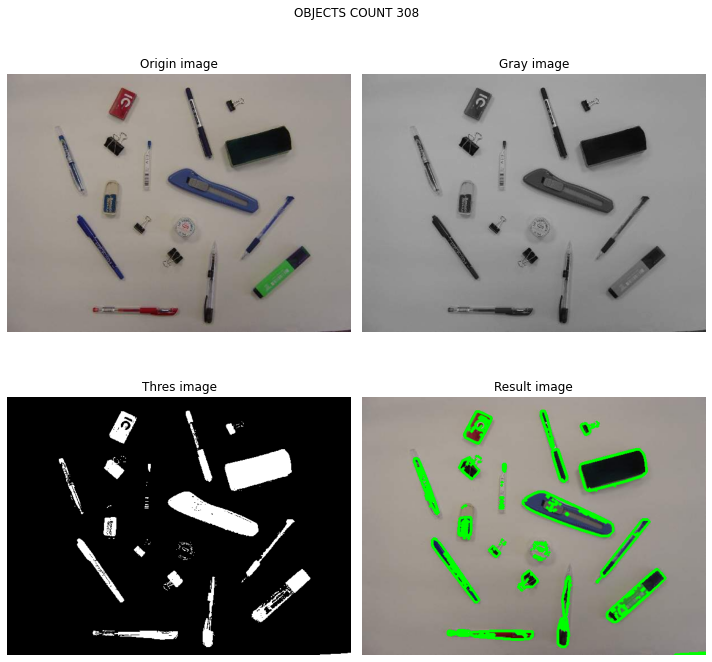

In [103]:
contours = baseline(img1, need_center=False)

### Model baseline kèm với việc loại bỏ các vùng có kích thước nhỏ ###
- kết quả cải thiện hơn rất nhiều

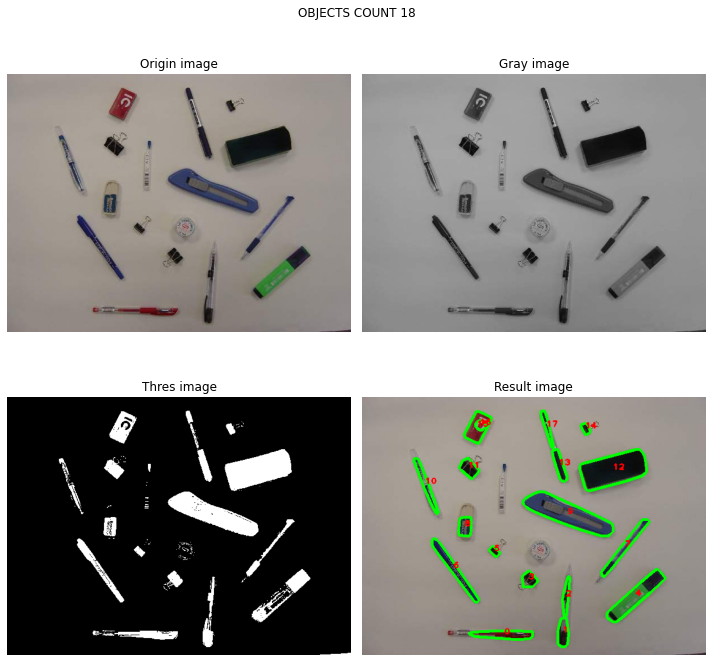

In [102]:
contours = baseline(img1,need_refine=True)

## Cải tiến 1: thực hiện các phép biến đổi hình thái cho ảnh lấy ngưỡng ##

In [110]:
def improve_1(img, need_hull=True, need_refine=False, need_center=True):
    plt.rcParams["figure.figsize"] = (20,20)
    fig, axes = plt.subplots(3,2)
    
    axes[0][0].set_title("Origin image")
    axes[0][0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0][0].set_axis_off()
    
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    axes[0][1].set_title("Gray image")
    axes[0][1].imshow(gray_img, cmap='gray', vmin=0, vmax=255)
    axes[0][1].set_axis_off()
    
    thres, thres_img = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    axes[1][0].set_title("Thres image")
    axes[1][0].imshow(thres_img, cmap='gray', vmin=0, vmax=255)
    axes[1][0].set_axis_off()
    
    kernel = np.ones((5,5),np.uint8)
    # thực hiện phép đóng
    thres_img_close = cv2.morphologyEx(thres_img, cv2.MORPH_CLOSE, kernel)
    axes[1][1].set_title("Thres image close")
    axes[1][1].imshow(thres_img_close, cmap='gray', vmin=0, vmax=255)
    axes[1][1].set_axis_off()
    # thực hiện phép mở
    thres_img_open = cv2.morphologyEx(thres_img_close, cv2.MORPH_OPEN, kernel)
    axes[2][0].set_title("Thres image open")
    axes[2][0].imshow(thres_img_open, cmap='gray', vmin=0, vmax=255)
    axes[2][0].set_axis_off()
    
    contours, hierarchy = cv2.findContours(thres_img_open,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    if need_hull:
        contours = [cv2.convexHull(element) for element in contours]
    if need_refine:
        contours = refine_contours(contours)
    outer = cv2.drawContours(img.copy(), contours, -1, (0,255,0), 3)
    if need_center:
        draw_center(contours,outer)
    axes[2][1].set_title("Result image")
    axes[2][1].imshow(cv2.cvtColor(outer, cv2.COLOR_BGR2RGB))
    axes[2][1].set_axis_off()
    
    fig.suptitle("OBJECTS COUNT "+str(len(contours)))
    fig.tight_layout()
    plt.show()   
    
    return contours

### Thực hiện cải tiến 1, không tiến hành loại bỏ contours có kích thước nhỏ ###
- kết quả thu được tốt hơn rất nhiều so với model baseline tương ứng khi cũng không loại bỏ contours có kích thước nhỏ

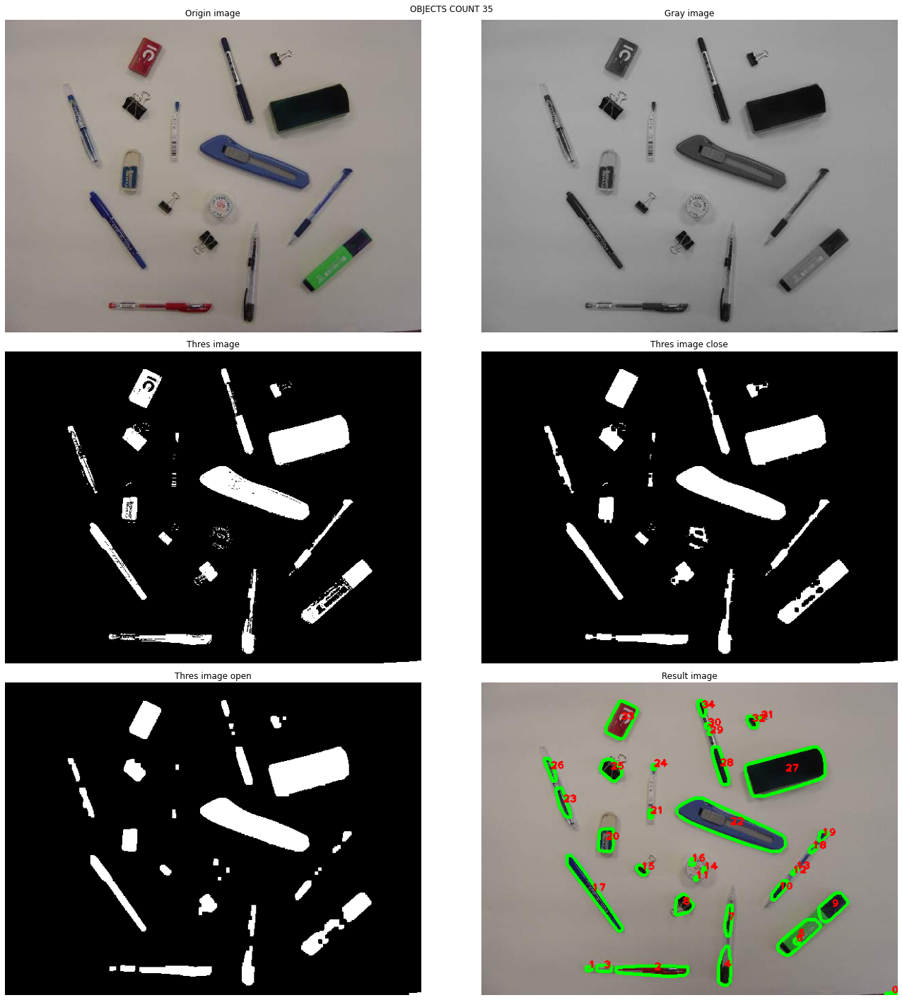

In [111]:
contours = improve_1(img1)

### Kết hợp cải tiến 1 với việc loại bỏ các contours có kích thước nhỏ ###
- kết quả thu được có vẻ không tốt bằng của model baseline

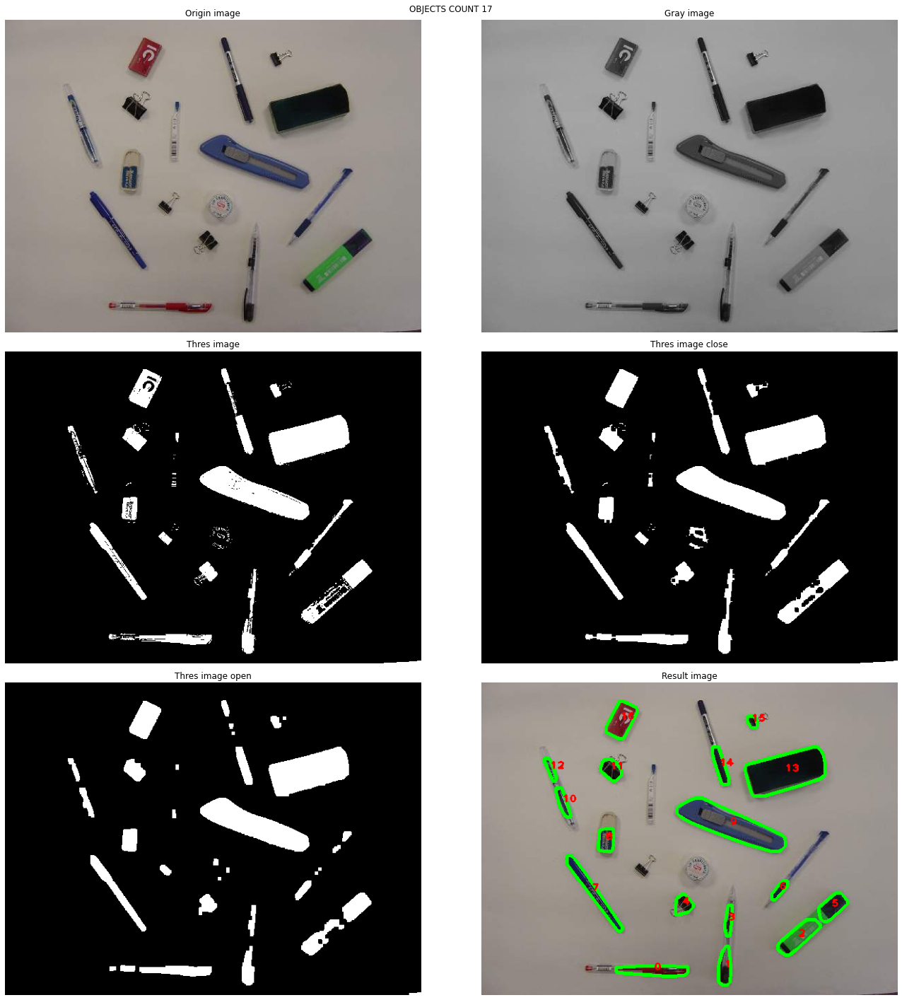

In [107]:
contours = improve_1(img1, need_refine=True)

## Cải tiến 2 thực hiện tìm cạnh trên ảnh, fill không gian được bao bởi các cạnh, tìm số vùng liên thông trên ảnh này ##

In [135]:
def improve_2(img, need_hull=True, need_refine=False, need_center=True):
    plt.rcParams["figure.figsize"] = (20,20)
    fig, axes = plt.subplots(4,2)

    axes[0][0].set_title("Origin image")
    axes[0][0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0][0].set_axis_off()
    
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    axes[0][1].set_title("Gray image")
    axes[0][1].imshow(gray_img, cmap="gray", vmin=0, vmax=255)
    axes[0][1].set_axis_off()
    
    min_thresh=0.66*np.median(gray_img)
    max_thresh=1.33*np.median(gray_img)
    # tìm các cạnh trên ảnh
    edge_img = cv2.Canny(gray_img,min_thresh,max_thresh)
    axes[1][0].set_title("Edge image")
    axes[1][0].imshow(edge_img, cmap="gray", vmin=0, vmax=255)
    axes[1][0].set_axis_off()
    
    kernel = np.ones((5,5),np.uint8)
    # thực hiện 2 phép biến đổi hình thái để cạnh thu được chuẩn xác hơn
    edge_process_img = cv2.dilate(edge_img, kernel, iterations=1)
    edge_process_img = cv2.erode(edge_process_img, kernel, iterations=1)
    axes[1][1].set_title("Edge process image")
    axes[1][1].imshow(edge_process_img, cmap="gray", vmin=0, vmax=255)
    axes[1][1].set_axis_off()
    
    floodfill_img = edge_process_img.copy()
    h, w = floodfill_img.shape[:2]
    area = h*w
    mask = np.zeros((h+2, w+2), np.uint8) 
    # fill không gian được bao bởi các cạnh
    cv2.floodFill(floodfill_img, mask, (0,0), 255)
    axes[2][0].set_title("Floodfill image")
    axes[2][0].imshow(floodfill_img, cmap="gray", vmin=0, vmax=255)
    axes[2][0].set_axis_off()
    
    floodfill_inv_img = cv2.bitwise_not(floodfill_img)
    axes[2][1].set_title("Floodfill inverse image")
    axes[2][1].imshow(floodfill_inv_img, cmap="gray", vmin=0, vmax=255)
    axes[2][1].set_axis_off()
    
    floodfill_inv_edge_img = edge_process_img | floodfill_inv_img
    axes[3][0].set_title("Floodfill inverse edge image")
    axes[3][0].imshow(floodfill_inv_edge_img, cmap="gray", vmin=0, vmax=255)
    axes[3][0].set_axis_off()
    
    
    
    contours, hierarchy = cv2.findContours(floodfill_inv_edge_img,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    if need_hull:
        contours = [cv2.convexHull(element) for element in contours]
    if need_refine:
        contours = refine_contours(contours)
    outer = cv2.drawContours(img.copy(), contours, -1, (0,255,0), 3)
    if need_center:
        draw_center(contours,outer)
    axes[3][1].set_title("Result image")
    axes[3][1].imshow(cv2.cvtColor(outer, cv2.COLOR_BGR2RGB))
    axes[3][1].set_axis_off()
    
    fig.suptitle("OBJECTS COUNT "+str(len(contours)))
    fig.tight_layout()
    plt.show() 
    
    return contours

### Kết quả cải tiến 2 khi chưa loại bỏ contours có kích thước nhỏ đạt được tốt hơn 2 phương pháp trên ##

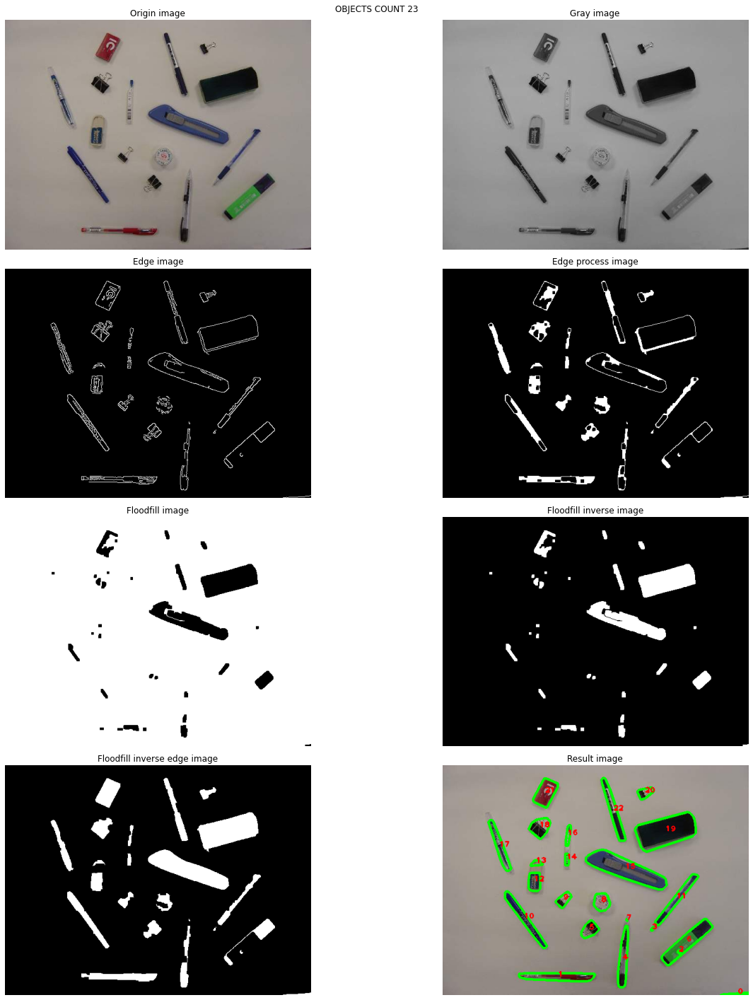

In [136]:
contours = improve_2(img1)

### Cải tiến 2 cộng với loại bỏ contours có kích thước nhỏ cho kết quả tốt ## 

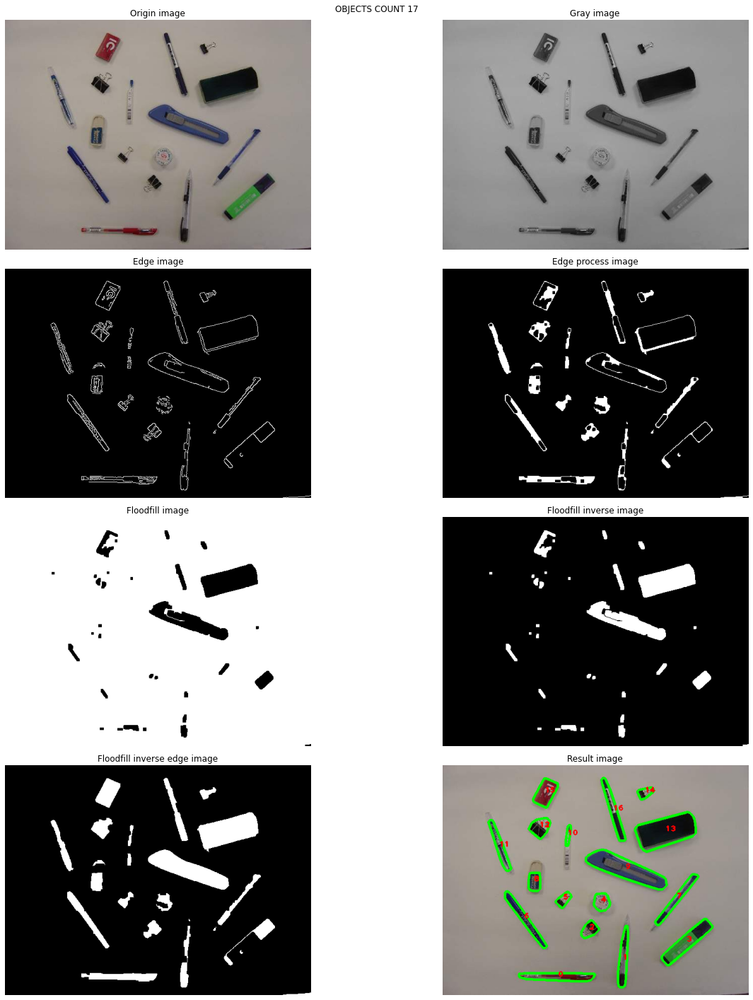

In [137]:
contours = improve_2(img1,need_refine=True)

## Dự đoán trên một số ảnh khác ##

In [138]:
img2 = cv2.imread("objets2.jpg")

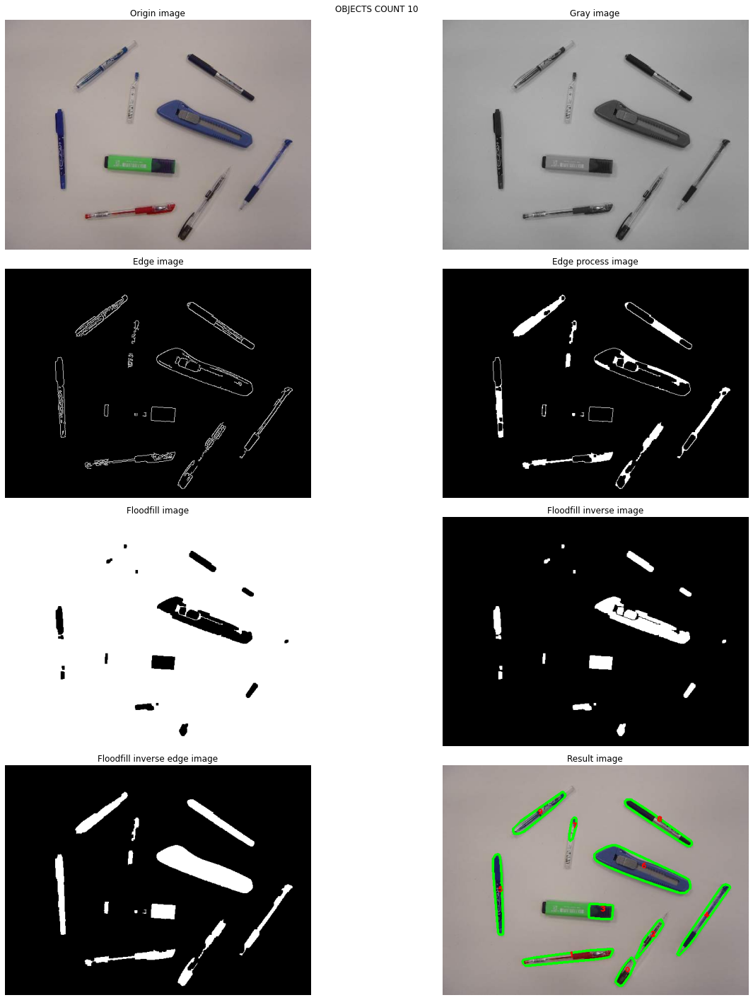

In [139]:
contours = improve_2(img2, need_refine=True)

In [140]:
img3 = cv2.imread("objets3.jpg")

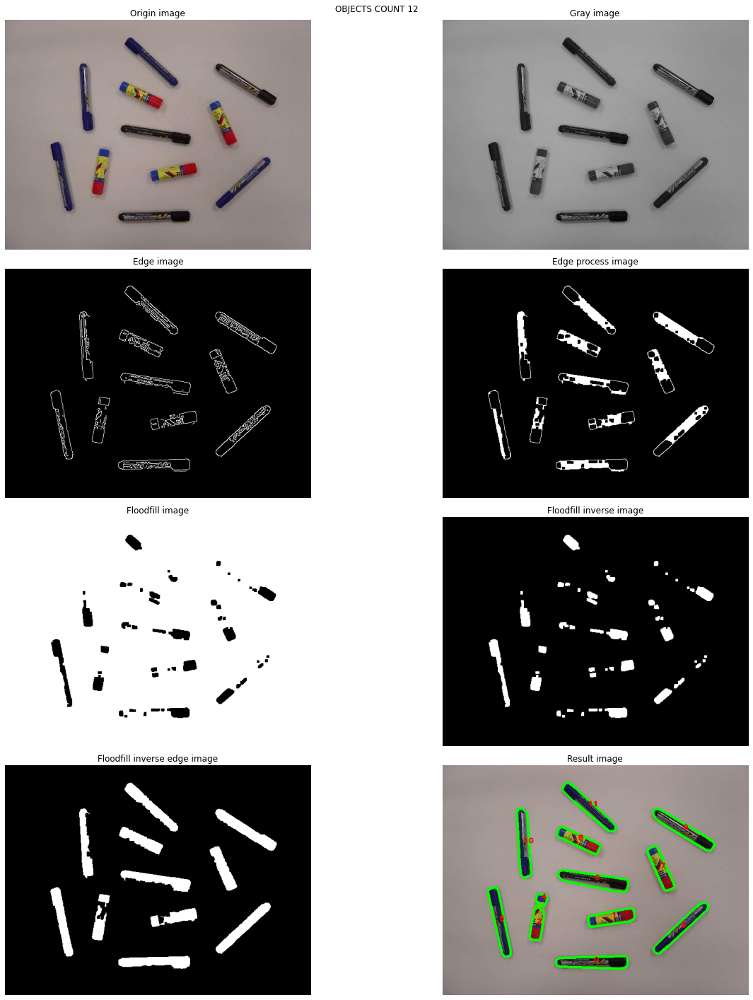

In [141]:
contours = improve_2(img3, need_refine=True)

In [142]:
img4 = cv2.imread("objets4.jpg")

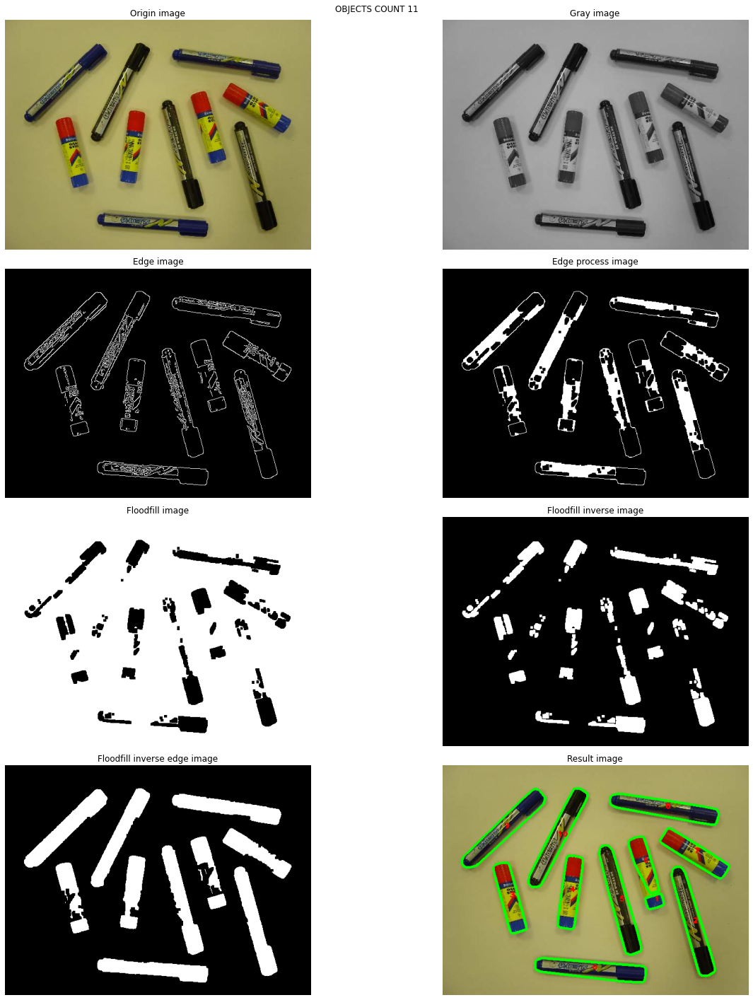

In [143]:
contours = improve_2(img4, need_refine=True)

In [5]:
img5 = cv2.imread("origin.png")

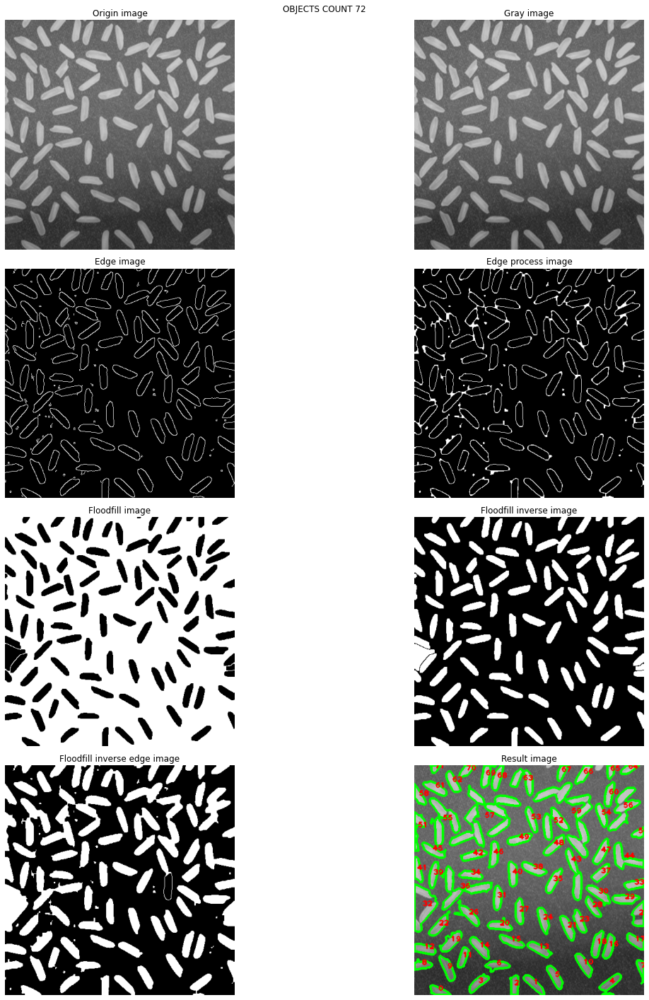

In [145]:
contours = improve_2(img5, need_refine=True, need_hull=False)

## Với ảnh bị nhiễu muối tiêu, thực hiện lọc trung vị cho kết quả cải thiện đáng kể ##

In [198]:
def apply_median(img):
    img_process = cv2.medianBlur(img,3)
    plt.rcParams["figure.figsize"] = (10,5)
    fig, axes = plt.subplots(1,2)

    axes[0].set_title("Origin image")
    axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0].set_axis_off()

    axes[1].set_title("Process image")
    axes[1].imshow(cv2.cvtColor(img_process, cv2.COLOR_BGR2RGB))
    axes[1].set_axis_off()
    
    fig.suptitle("APPLY MEDIAN BLUR")
    fig.tight_layout()
    plt.show()
    
    return img_process

In [168]:
img6 = cv2.imread("salt.png")

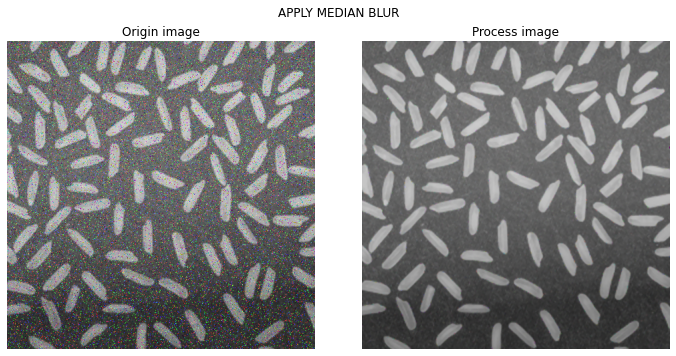

In [169]:
img6_process = apply_median(img6)

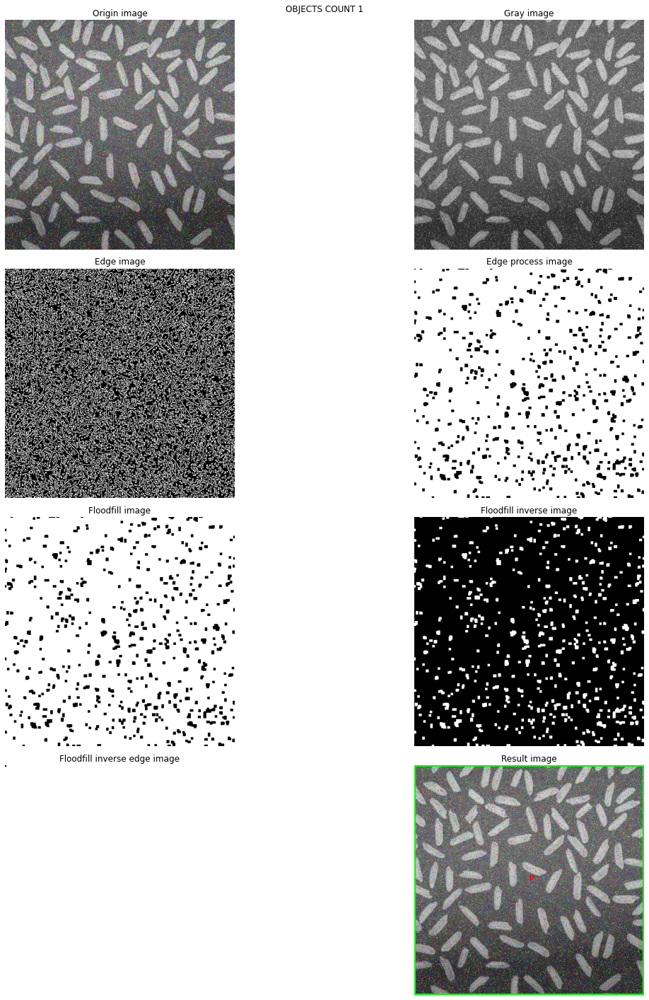

In [171]:
contours = improve_2(img6, need_refine=True, need_hull=False)

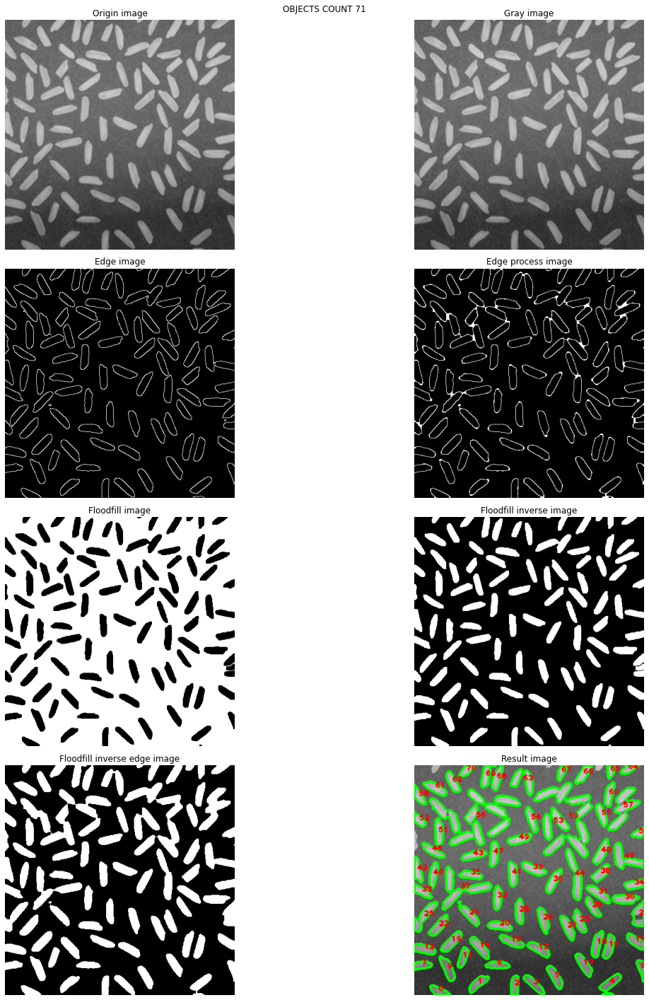

In [170]:
contours = improve_2(img6_process, need_refine=True, need_hull=False)

## Ảnh tối ##

In [172]:
img7 = cv2.imread("complex_light.png")

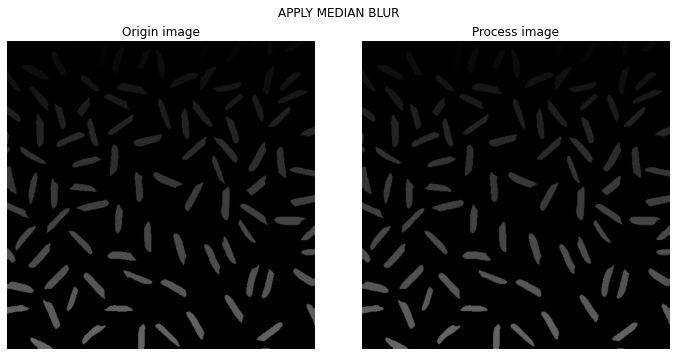

In [173]:
img7_process = apply_median(img7)

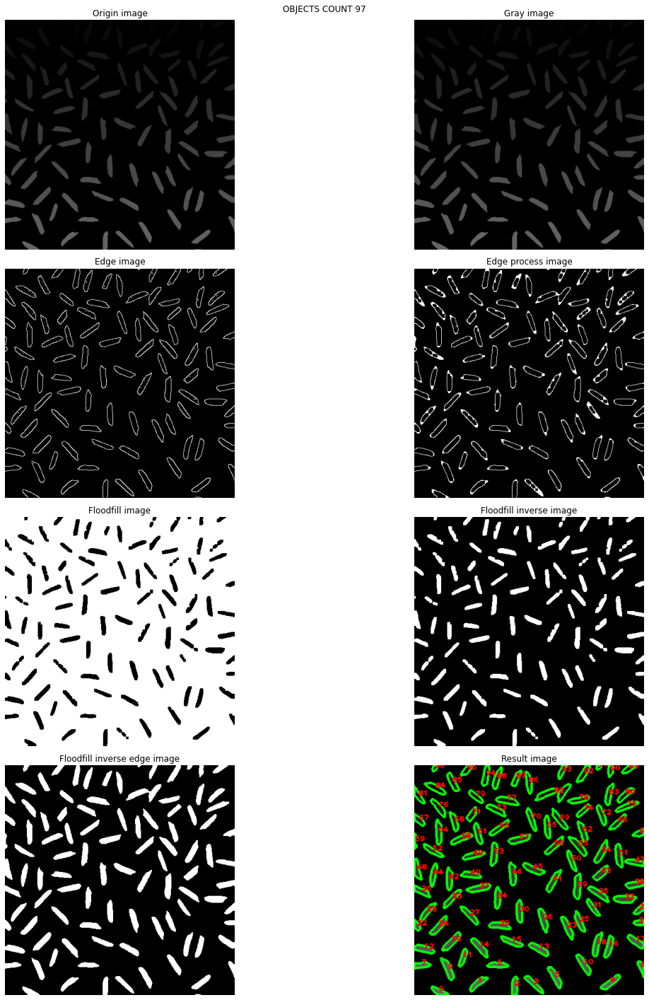

In [174]:
contours = improve_2(img7, need_refine=True, need_hull=False)

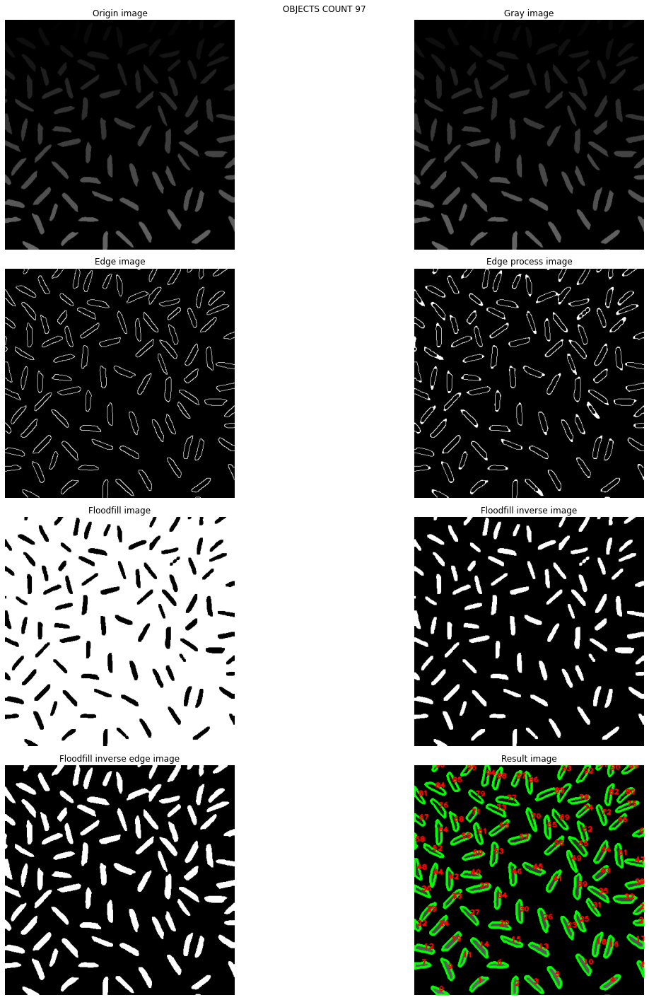

In [175]:
contours = improve_2(img7_process, need_refine=True, need_hull=False)

## Ảnh nhiễu hình sine, thực hiện làm sạch nhờ biến đổi Fourier ##

In [259]:
#https://dsp.stackexchange.com/questions/20061/removing-periodic-noise-from-image-using-fourier-transform

def apply_fourier(img):
    img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    # calculate amplitude spectrum
    mag_spec = 20*np.log(np.abs(fshift))

    r = int(f.shape[0]/2)        
    c = int(f.shape[1]/2)         
    p = 1                         
    n = 5     
    
    fshift2 = np.copy(fshift)
    fshift2[c-p:c+p,0:r-n] = 0.01
    fshift2[c-p:c+p,r+n:r+r] = 0.01
    mag_spec2 = 20*np.log(np.abs(fshift2))
    inv_fshift = np.fft.ifftshift(fshift2)
    img_recon = np.real(np.fft.ifft2(inv_fshift))
    img_recon = img_recon.astype('uint8')

    plt.subplot(131),plt.imshow(img, cmap = 'gray')
    plt.title('Input Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(132),plt.imshow(mag_spec, cmap = 'gray')
    plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
    plt.subplot(133),plt.imshow(mag_spec2, cmap = 'gray')
    plt.title('Magnitude Spectrum after suppression'), plt.xticks([]), plt.yticks([])
    plt.show()

    plt.figure()
    plt.subplot(121),plt.imshow(img, cmap = 'gray')
    plt.title('Input Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img_recon, cmap = 'gray')
    plt.title('Output Image'), plt.xticks([]), plt.yticks([])
    plt.show()
    
    return cv2.cvtColor(img_recon,cv2.COLOR_GRAY2BGR)

In [260]:
img8 = cv2.imread("sine.png")

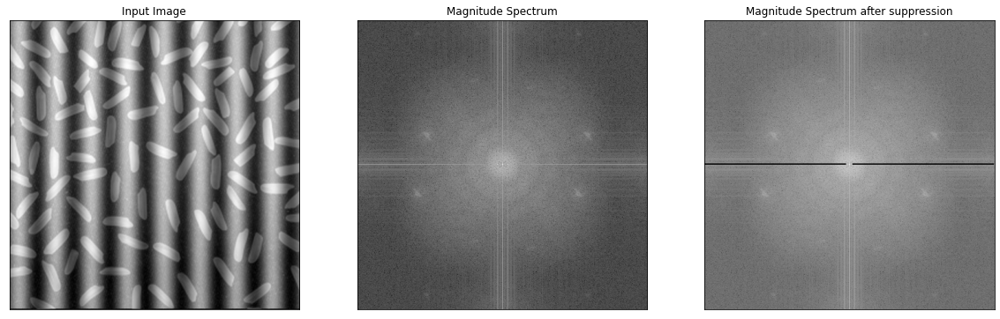

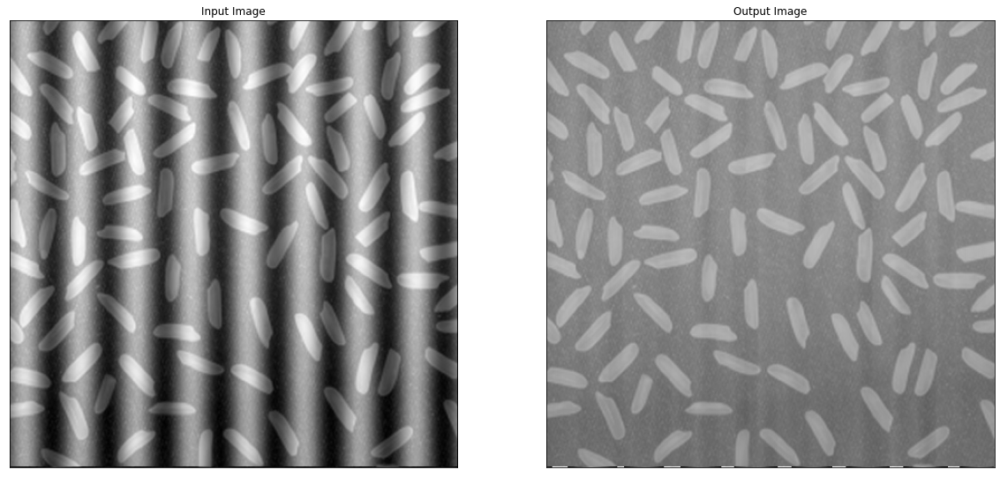

In [261]:
img8_process = apply_fourier(img8)

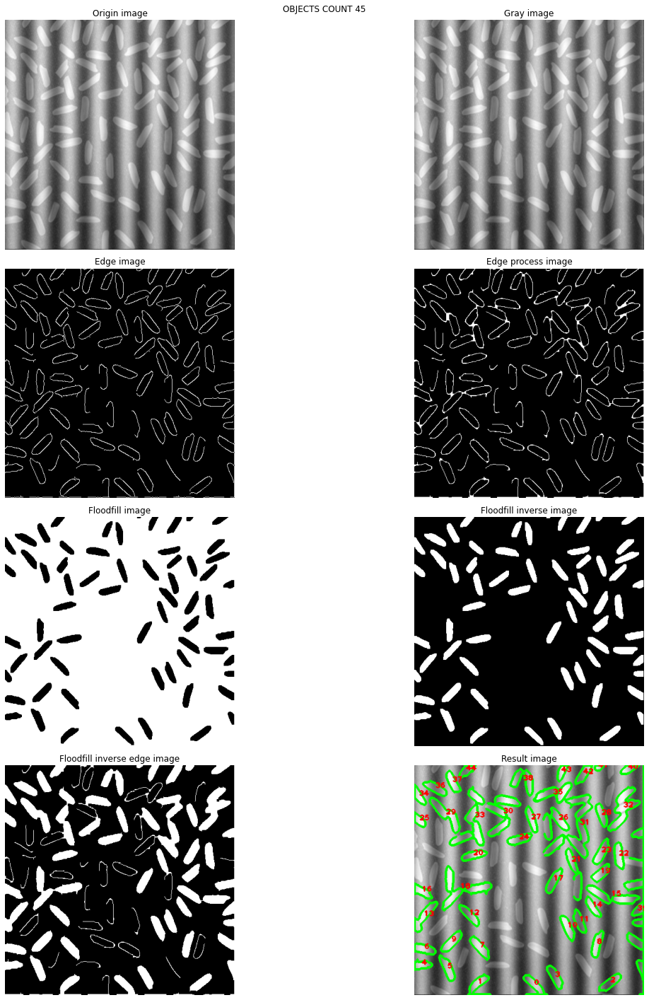

In [262]:
contours = improve_2(img8, need_refine=True, need_hull=False)

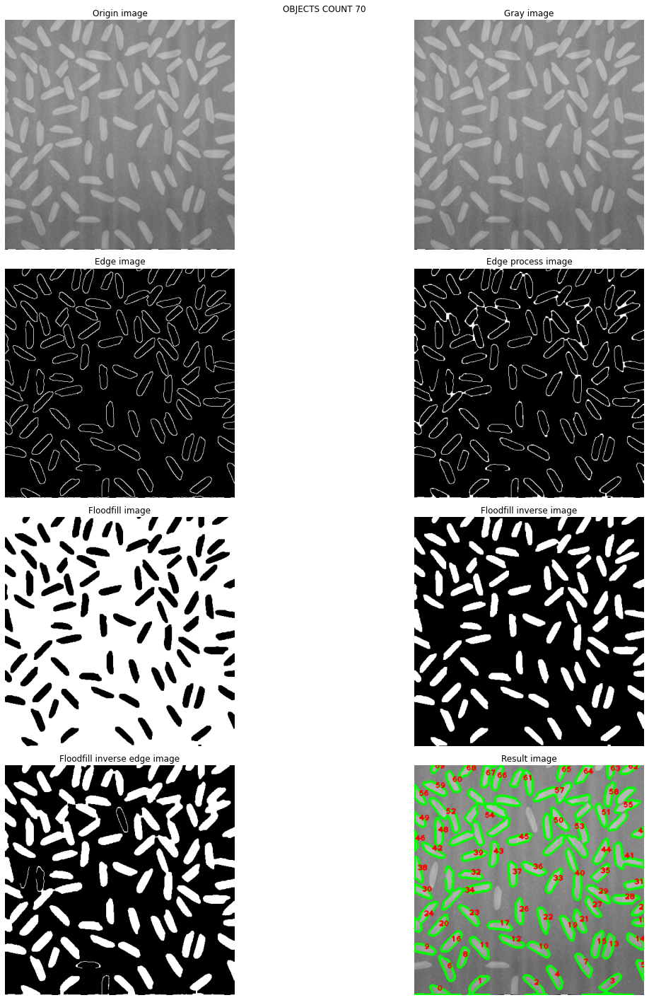

In [263]:
contours = improve_2(img8_process, need_refine=True, need_hull=False)